### 1. RAM testing 

In [ ]:
from ram.models import ram, tag2text
from ram import inference_ram, get_transform
from torchvision.transforms.functional import to_pil_image
import os
import torch
import numpy as np
from tqdm import tqdm
import cv2
import matplotlib.pyplot as plt

In [ ]:
# load RAM model from pretrained to check the detection accuracy and speed
device = "cuda" if torch.cuda.is_available() else "cpu"

model = ram(pretrained=None, image_size=384, vit='swin_l')

#download from online (wget did not work for me)
#https://huggingface.co/spaces/xinyu1205/recognize-anything/blob/main/ram_swin_large_14m.pth
checkpoint = torch.load(
    '../ram_swin_large_14m.pth',
    map_location=device,
)
model.load_state_dict(checkpoint['model'], strict=False)
model.eval().to(device)

/encoder/layer/0/crossattention/self/query is tied
/encoder/layer/0/crossattention/self/key is tied
/encoder/layer/0/crossattention/self/value is tied
/encoder/layer/0/crossattention/output/dense is tied
/encoder/layer/0/crossattention/output/LayerNorm is tied
/encoder/layer/0/intermediate/dense is tied
/encoder/layer/0/output/dense is tied
/encoder/layer/0/output/LayerNorm is tied
/encoder/layer/1/crossattention/self/query is tied
/encoder/layer/1/crossattention/self/key is tied
/encoder/layer/1/crossattention/self/value is tied
/encoder/layer/1/crossattention/output/dense is tied
/encoder/layer/1/crossattention/output/LayerNorm is tied
/encoder/layer/1/intermediate/dense is tied
/encoder/layer/1/output/dense is tied
/encoder/layer/1/output/LayerNorm is tied


RAM(
  (visual_encoder): SwinTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 192, kernel_size=(4, 4), stride=(4, 4))
      (norm): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (layers): ModuleList(
      (0): BasicLayer(
        dim=192, input_resolution=(96, 96), depth=2
        (blocks): ModuleList(
          (0): SwinTransformerBlock(
            dim=192, input_resolution=(96, 96), num_heads=6, window_size=12, shift_size=0, mlp_ratio=4.0
            (norm1): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
            (attn): WindowAttention(
              dim=192, window_size=(12, 12), num_heads=6
              (qkv): Linear(in_features=192, out_features=576, bias=True)
              (attn_drop): Dropout(p=0.0, inplace=False)
              (proj): Linear(in_features=192, out_features=192, bias=True)
              (proj_drop): Dropout(p=0.0, inplace=False)
              (softmax): Softmax(dim=-

In [ ]:
# open a random test video to run frame-by-frame
vid = cv2.VideoCapture('../rollout_go_room.mp4')
frames = []
while True:
    ok, frame = vid.read()
    if not ok: break
    frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

    vid = cv2.VideoCapture('../rollout_go_room.mp4')
frame_idx = 0

while True:
    ok, frame = vid.read()
    if not ok:
        break

    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    cv2.imshow('Frame', cv2.cvtColor(frame_rgb, cv2.COLOR_RGB2BGR))

    print(f"Frame {frame_idx}")
    frame_idx += 1

    key = cv2.waitKey(0)
    if key == ord('q'):
        break
    elif key == ord('n'):
        continue

vid.release()
cv2.destroyAllWindows()

OpenCV: Couldn't read video stream from file "../rollout_go_room.mp4"


In [ ]:
# run the "tag2text" detection model from RAM over the frames to create a boolean mask array
transform = get_transform(image_size=384) 
tag_dict = tag2text()

television_mask = [] 

for idx, frame_rgb in enumerate(tqdm(frames, desc="Processing frames with RAM")):
    frame_pil = to_pil_image(frame_rgb)
    frame_tensor = transform(frame_pil).unsqueeze(0).to(device)
    
    with torch.no_grad():
        tags, _ = inference_ram(frame_tensor, model)
    
    if 'television' in tags: 
        television_mask.append(1)
        print(tags)
    else:
        television_mask.append(0)
    

/encoder/layer/0/crossattention/self/query is tied
/encoder/layer/0/crossattention/self/key is tied
/encoder/layer/0/crossattention/self/value is tied
/encoder/layer/0/crossattention/output/dense is tied
/encoder/layer/0/crossattention/output/LayerNorm is tied
/encoder/layer/0/intermediate/dense is tied
/encoder/layer/0/output/dense is tied
/encoder/layer/0/output/LayerNorm is tied
/encoder/layer/1/crossattention/self/query is tied
/encoder/layer/1/crossattention/self/key is tied
/encoder/layer/1/crossattention/self/value is tied
/encoder/layer/1/crossattention/output/dense is tied
/encoder/layer/1/crossattention/output/LayerNorm is tied
/encoder/layer/1/intermediate/dense is tied
/encoder/layer/1/output/dense is tied
/encoder/layer/1/output/LayerNorm is tied


Processing frames with RAM:  41%|████      | 105/256 [01:47<02:09,  1.17it/s]

wall | flat | hang | screen | television


Processing frames with RAM:  41%|████▏     | 106/256 [01:48<02:07,  1.17it/s]

flat | ice cave | man | screen | television


Processing frames with RAM:  42%|████▏     | 107/256 [01:49<02:06,  1.18it/s]

flat | ice cave | man | room | screen | television


Processing frames with RAM:  43%|████▎     | 109/256 [01:51<02:04,  1.18it/s]

flat | man | television


Processing frames with RAM:  43%|████▎     | 110/256 [01:52<02:03,  1.18it/s]

wall | carpet | ceiling | flat | floor | living room | room | television


Processing frames with RAM:  48%|████▊     | 123/256 [02:02<01:47,  1.24it/s]

wall | flat | hang | sea | screen | television


Processing frames with RAM:  48%|████▊     | 124/256 [02:03<01:48,  1.22it/s]

wall | computer monitor | flat | hang | ice cave | room | screen | television


Processing frames with RAM:  49%|████▉     | 126/256 [02:05<01:51,  1.16it/s]

computer | computer monitor | computer screen | table | flat | office | room | screen | television


Processing frames with RAM:  50%|████▉     | 127/256 [02:06<01:50,  1.16it/s]

ceiling | computer | computer monitor | computer screen | table | floor | office | office building | office cubicle | room | stool | television


Processing frames with RAM:  50%|█████     | 128/256 [02:07<01:58,  1.08it/s]

blind | wall | carpet | ceiling | computer | computer monitor | doorway | flat | floor | office | office building | room | television


Processing frames with RAM:  50%|█████     | 129/256 [02:08<02:00,  1.05it/s]

blind | wall | carpet | ceiling | computer | computer monitor | doorway | flat | floor | office | office building | room | television


Processing frames with RAM:  51%|█████     | 130/256 [02:09<01:55,  1.10it/s]

blind | wall | carpet | ceiling | computer | computer monitor | doorway | flat | floor | office | office building | room | television


Processing frames with RAM:  51%|█████     | 131/256 [02:09<01:51,  1.12it/s]

blind | wall | carpet | ceiling | computer | computer monitor | doorway | flat | floor | office | office building | room | television


Processing frames with RAM:  63%|██████▎   | 161/256 [02:34<01:16,  1.24it/s]

wall | lamp | computer | doorway | floor | image | living room | room | speaker | stool | television


Processing frames with RAM:  65%|██████▍   | 166/256 [02:38<01:13,  1.22it/s]

bed | bedroom | blue | carpet | ceiling | chair | computer | computer desk | table | floor | room | stool | television


Processing frames with RAM:  73%|███████▎  | 186/256 [02:54<00:55,  1.25it/s]

wall | lamp | cave | fireplace | flat | ice cave | living room | room | television


Processing frames with RAM:  73%|███████▎  | 188/256 [02:56<00:55,  1.23it/s]

wall | carpet | ceiling | computer | doorway | flat | floor | lead to | room | television


Processing frames with RAM: 100%|██████████| 256/256 [03:51<00:00,  1.11it/s]


In [ ]:
#open the frames with TV detected to check the accuracy

video_path = '../rollout_go_room.mp4'
vid = cv2.VideoCapture(video_path)

frame_idx = 0 
mask_idx = 0

while True:
    ok, frame = vid.read()
    if not ok:
        break
    
    if television_mask[mask_idx] == 1:
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(8,6))
        plt.imshow(frame_rgb)
        plt.title(f"Frame {frame_idx} - Television Detected")
        plt.axis('off')
        plt.show(block=True)
    
    frame_idx += 1
    mask_idx += 1

vid.release()
print(sum(television_mask))

OpenCV: Couldn't read video stream from file "../rollout_go_room.mp4"


### 2. YOLO segmentation model - compare to RAM and select best option

In [33]:
# must downgrade to numpy <2 to make YOLO model load correctly
from ultralytics import YOLO
from PIL import Image
import numpy as np
import cv2
!pip uninstall numpy -y
!pip install "numpy<2" --force-reinstall
!pip install "torch>2.2" torchvision gradio
!pip install git+https://github.com/huggingface/transformers
print(np.__version__)
!pip install --upgrade ultralytics


Found existing installation: numpy 2.2.6
Uninstalling numpy-2.2.6:
  Successfully uninstalled numpy-2.2.6
  Using cached numpy-1.26.4-cp310-cp310-macosx_11_0_arm64.whl.metadata (61 kB)
Using cached numpy-1.26.4-cp310-cp310-macosx_11_0_arm64.whl (14.0 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
sentence-transformers 5.1.2 requires transformers<5.0.0,>=4.41.0, but you have transformers 5.0.0.dev0 which is incompatible.
  Cloning https://github.com/huggingface/transformers to /private/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/pip-req-build-rpi6zhn8
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers /private/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/pip-req-build-rpi6zhn8
  Re

In [ ]:
#detect to find TV frame-by-frame using the YOLO model this time
television_mask = []
model = YOLO("yolov8n-seg.pt")

for idx, frame_rgb in enumerate(tqdm(frames, desc="Processing frames with YOLO")):
    frame = np.array(frame_rgb, dtype=np.uint8)
    
    results = model(frame)
    detected_labels = [model.names[int(cls)] for cls in results[0].boxes.cls]

    if "television" in detected_labels or "tv" in detected_labels:
        television_mask.append(1)
    else:
        television_mask.append(0)
    
print(sum(television_mask))

Processing frames with YOLO: 0it [00:00, ?it/s]

0


### 3. Implement the final YOLO + BLIP pipeline

In [38]:
import faiss
import numpy as np

EMB_DIM = 512

index = faiss.IndexFlatL2(EMB_DIM)
faiss_metadata = []

In [39]:
from transformers import CLIPProcessor, CLIPModel

clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
clip_proc  = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

def get_embedding(pil_image):
    inputs = clip_proc(images=pil_image, return_tensors="pt")
    with torch.no_grad():
        emb = clip_model.get_image_features(**inputs)
    emb = emb.cpu().numpy().astype("float32")
    return emb[0]

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


In [40]:
import torch
import os
import ultralytics
from transformers import BlipProcessor, BlipForConditionalGeneration
import json

device = "cuda" if torch.cuda.is_available() else "cpu"

# BLIP
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
blip = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device)
blip.eval()


model = YOLO("yolov8n-seg.pt")

# Objects to track, with dictionary to convert from ProcTHOR to yolo
objects = ['Apple', 'BaseballBat', 'Bed', 'Book', 'Bowl', 'Box', 'Bread', 'Candle', 'Cart', 'CellPhone', 'Chair', 'CoffeeMachine', 'CounterTop', 'CreditCard', 'Cup', 'DiningTable', 'DogBed', 'Doorway', 'Drawer', 'Dresser', 'Egg', 'Faucet', 'Floor', 'Fridge', 'GarbageBag', 'GarbageCan', 'HousePlant', 'Kettle', 'KeyChain', 'Knife', 'Laptop', 'LaundryHamper', 'Lettuce', 'Mug', 'Painting', 'PaperTowelRoll', 'Pen', 'Pencil', 'PepperShaker', 'Pillow', 'Plate', 'Plunger', 'RemoteControl', 'Shelf', 'ShelvingUnit', 'Sink', 'SinkBasin', 'SoapBottle', 'Sofa', 'Spoon', 'SprayBottle', 'Statue', 'TVStand', 'Television', 'TennisRacket', 'Toilet', 'ToiletPaper', 'Wall', 'Watch', 'Window', 'WineBottle']
label_map = {
    "apple": ["Apple"],
    "baseball bat": ["BaseballBat"],
    "bed": ["Bed"],
    "book": ["Book"],
    "bowl": ["Bowl"],
    "cup": ["Cup", "Mug"],
    "bottle": ["WineBottle", "SprayBottle", "SoapBottle"],
    "refrigerator": ["Fridge"],
    "sink": ["Sink", "SinkBasin"],
    "chair": ["Chair"],
    "couch": ["Sofa"],
    "potted plant": ["HousePlant"],
    "laptop": ["Laptop"],
    "tv": ["Television", "TVStand"],
    "remote": ["RemoteControl"],
    "knife": ["Knife"],
    "fork": ["Spoon"],
    "spoon": ["Spoon"],
    "cell phone": ["CellPhone"],
    "toilet": ["Toilet"],
    "microwave": ["CoffeeMachine"],
    "handbag": ["LaundryHamper"], 
    "dining table": ["DiningTable"],
}

output_json = "object_stats_output.json"
results_all = {}

root_dir = '/Users/darpalpatel/Projects/NavAssistant/Exploration/data/images/videos'

for subfolder in sorted(os.listdir(root_dir)):
    folder_path = os.path.join(root_dir, subfolder)
    results_all[subfolder] = {}

    if not os.path.isdir(folder_path):
        continue

    print(f"\n===== Processing folder: {subfolder} =====\n")

    # Loop through videos inside each subfolder
    for path in os.listdir(folder_path):

        if not path.lower().endswith((".mp4", ".mov", ".avi", ".mkv")):
            continue

        video_path = os.path.join(folder_path, path)
        video_id = f"{subfolder}_{path}" 
        print(f"\nProcessing video: {path} ...\n")

        cap = cv2.VideoCapture(video_path)

        occurrences = {obj: 0 for obj in objects}
        coverage = {obj: [] for obj in objects}

        frame_idx = 0

        while True:
            ok, frame = cap.read()
            if not ok:
                break

            # Skip odd frames
            if frame_idx % 2 != 0:
                frame_idx += 1
                continue

            h, w, _ = frame.shape
            frame_area = h * w

            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frame_pil = Image.fromarray(frame_rgb)

            # YOLO inference
            results = model(np.array(frame_rgb, dtype=np.uint8))

            boxes = results[0].boxes
            masks = results[0].masks

            crops_list = []
            crop_objects_list = []
            boxes_list = []
            yolo_indices = []

            for det_idx in range(len(boxes)):
                box = boxes.xyxy[det_idx]
                cls = boxes.cls[det_idx]

                yolo_label = model.names[int(cls)]
                x1, y1, x2, y2 = [int(c) for c in box]

                # Skip tiny detections of <0.5% of frame
                if (x2 - x1) * (y2 - y1) / frame_area < 0.005:
                    continue

                crop = frame_pil.crop((x1, y1, x2, y2))

                crops_list.append(crop)
                crop_objects_list.append(yolo_label)
                boxes_list.append((x1, y1, x2, y2))
                yolo_indices.append(det_idx)

            # BLIP batch captioning
            blip_captions = []
            if crops_list:
                inputs = processor(images=crops_list, return_tensors="pt", padding=True)
                inputs = {k: v.to(device) for k, v in inputs.items()}

                with torch.no_grad():
                    outs = blip.generate(**inputs)

                blip_captions = [
                    processor.decode(out, skip_special_tokens=True).lower()
                    for out in outs
                ]

            # Combine YOLO + BLIP results
            for i, blip_caption in enumerate(blip_captions):

                yolo_label = crop_objects_list[i]
                x1, y1, x2, y2 = boxes_list[i]
                det_idx = yolo_indices[i]

                yl = yolo_label.lower()
                detected_objs = []
                if yl in label_map:
                    detected_objs.extend(label_map[yl])
                for obj in objects:
                    if obj.lower() in blip_caption:
                        detected_objs.append(obj)

                detected_objs = list(set(detected_objs))
                if not detected_objs:
                    continue
                crop_pil = crops_list[i]
                emb = get_embedding(crop_pil)  # shape (EMB_DIM,)
                emb_f32 = emb.reshape(1, -1).astype("float32")
                index.add(emb_f32)

                # store metadata for lookup
                faiss_metadata.append({
                    "video_id": video_id,           # unique identifier
                    "label": detected_objs,
                    "blip_caption": blip_caption,
                    "bbox": (x1, y1, x2, y2),
                    "frame": frame_idx
                })

                # Compute % of frame coverage
                for obj in detected_objs:
                    occurrences[obj] += 1

                    if masks is not None and hasattr(masks, "data"):
                        seg_mask = masks.data[det_idx].cpu().numpy()
                        coverage_fraction = seg_mask.sum() / frame_area
                    else:
                        coverage_fraction = (x2 - x1) * (y2 - y1) / frame_area

                    coverage[obj].append(round(float(coverage_fraction), 4))

            frame_idx += 1
            if frame_idx % 50 == 0:
                print(f"Processed {frame_idx} frames...")
        
        cap.release()

        # Store final stats for this video
        results_all[subfolder][path] = {
            obj: {
                "occurrences": occurrences[obj],
                "coverage": coverage[obj]
            }
            for obj in objects
        }

        print(f"Finished {path}.\n")
faiss.write_index(index, "object_memory.index")
with open(output_json, "w") as f:
    json.dump(results_all, f, indent=2)

with open("object_memory_meta.json", "w") as f:
    json.dump(faiss_metadata, f)

print(f"\nAll results saved to {output_json}")

Loading weights:   0%|          | 0/472 [00:00<?, ?it/s]

BlipForConditionalGeneration LOAD REPORT from: Salesforce/blip-image-captioning-base
Key                                       | Status     |  | 
------------------------------------------+------------+--+-
text_decoder.bert.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.



===== Processing folder: local_attn_random_resnet =====


Processing video: rollouttrapped.mp4 ...


0: 640x640 2 tvs, 336.5ms
Speed: 10.5ms preprocess, 336.5ms inference, 20.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 tvs, 156.3ms
Speed: 2.1ms preprocess, 156.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 bottle, 2 tvs, 137.1ms
Speed: 2.0ms preprocess, 137.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 person, 1 bottle, 1 potted plant, 1 tv, 1 vase, 171.2ms
Speed: 14.2ms preprocess, 171.2ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 person, 1 bottle, 2 tvs, 290.8ms
Speed: 2.3ms preprocess, 290.8ms inference, 15.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 persons, 1 couch, 197.3ms
Speed: 7.3ms preprocess, 197.3ms inference, 14.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 persons, 1 suitcase, 1 couch, 1 tv, 145.4ms


In [41]:
def query_object(query_pil, k=5):
    emb = get_embedding(query_pil).astype("float32").reshape(1, -1)
    D, I = index.search(emb, k)

    results = []
    for dist, idx in zip(D[0], I[0]):
        results.append({
            "distance": float(dist),
            "metadata": faiss_metadata[idx]
        })
    return results

query = Image.open("/Users/darpalpatel/Projects/NavAssistant/Exploration/data/images/chair.png")
matches = query_object(query, k=3)
print(matches)

[{'distance': 26.9964542388916, 'metadata': {'video_id': 'sliding_window_pace_rolloutinside_room.mp4', 'label': ['Chair'], 'blip_caption': 'a red chair with a white base and a black base', 'bbox': (233, 193, 268, 239), 'frame': 186}}, {'distance': 27.11905860900879, 'metadata': {'video_id': 'sliding_window_no_curiosity_rolloutinside_room.mp4', 'label': ['Chair'], 'blip_caption': 'a red chair with a white base and a black base', 'bbox': (251, 200, 291, 253), 'frame': 204}}, {'distance': 27.862838745117188, 'metadata': {'video_id': 'sliding_window_no_curiosity_rolloutinside_room.mp4', 'label': ['Chair'], 'blip_caption': 'a red chair with a white base', 'bbox': (251, 200, 291, 252), 'frame': 202}}]


Plotting subfolder: local_attn_random_resnet


/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/ipykernel_52483/3123640842.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(objs, rotation=90)
/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/ipykernel_52483/3123640842.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(objs, rotation=90)
/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/ipykernel_52483/3123640842.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(objs, rotation=90)


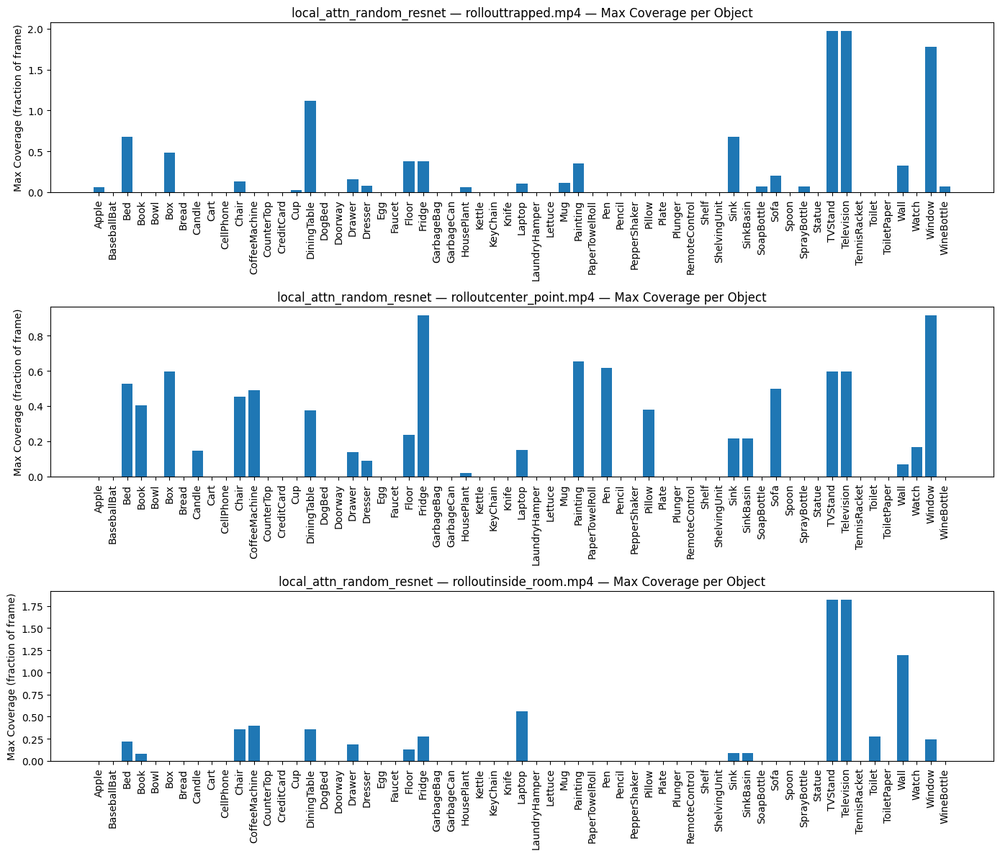

Plotting subfolder: new_end


/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/ipykernel_52483/3123640842.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(objs, rotation=90)
/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/ipykernel_52483/3123640842.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(objs, rotation=90)
/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/ipykernel_52483/3123640842.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(objs, rotation=90)


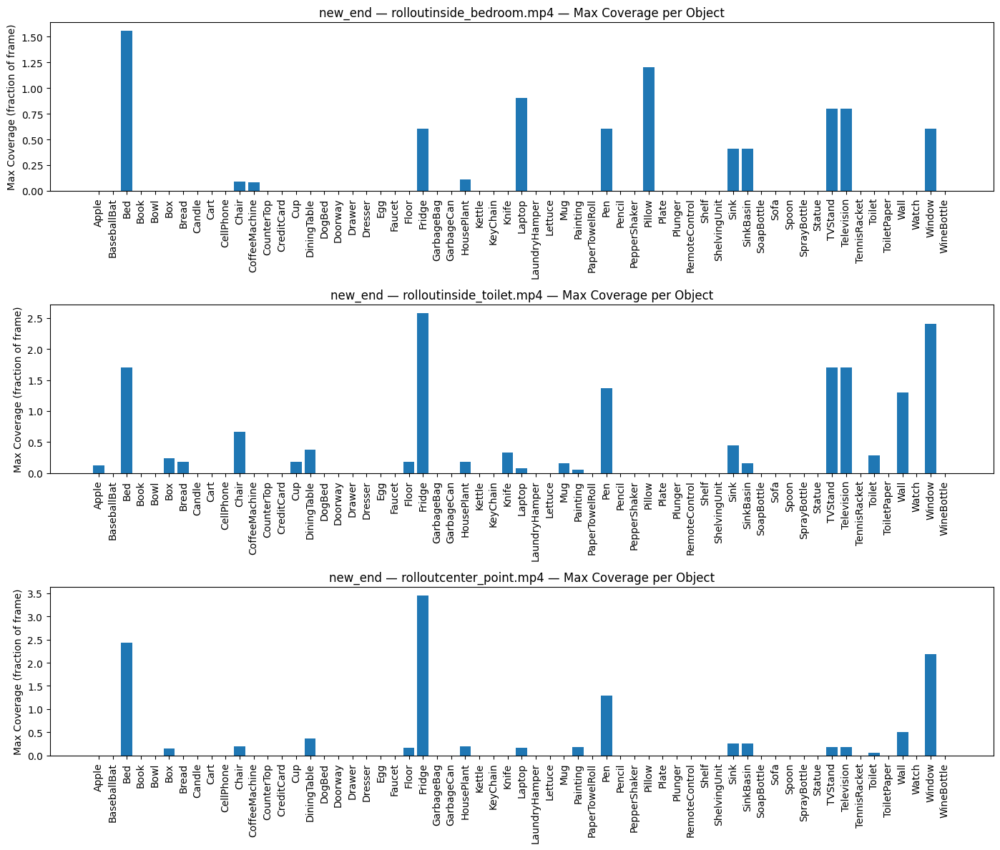

Plotting subfolder: random


/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/ipykernel_52483/3123640842.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(objs, rotation=90)
/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/ipykernel_52483/3123640842.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(objs, rotation=90)
/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/ipykernel_52483/3123640842.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(objs, rotation=90)


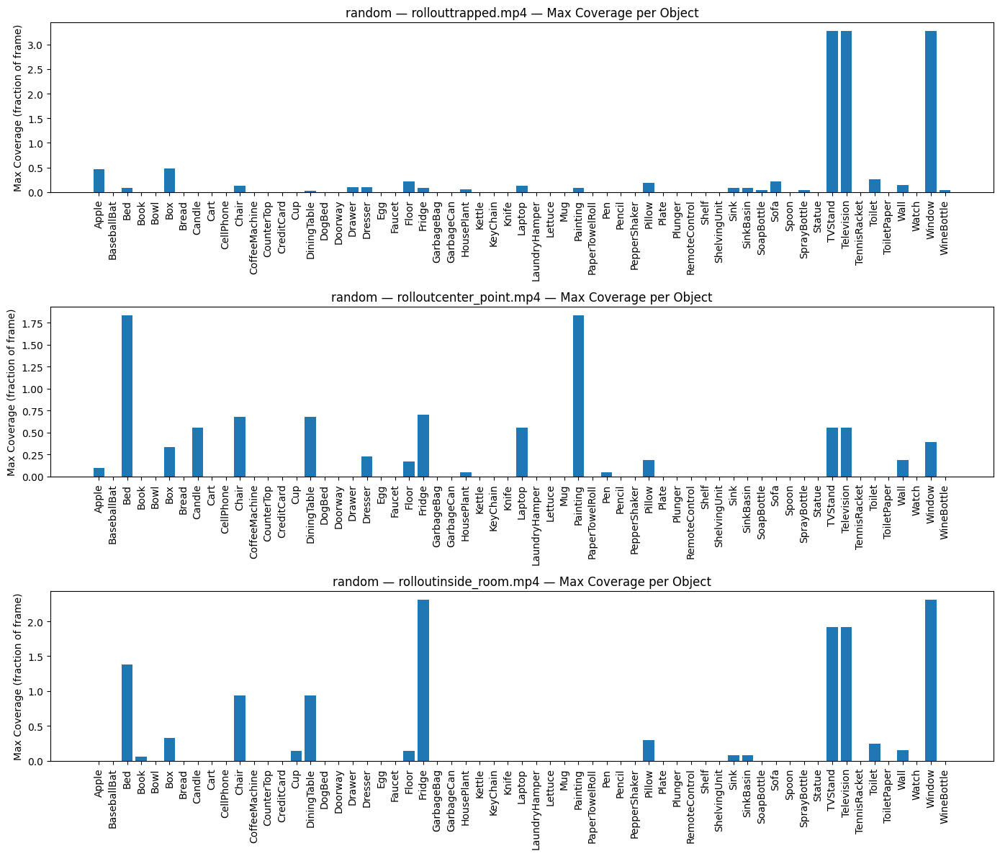

Plotting subfolder: sliding_window_no_curiosity


/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/ipykernel_52483/3123640842.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(objs, rotation=90)
/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/ipykernel_52483/3123640842.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(objs, rotation=90)
/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/ipykernel_52483/3123640842.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(objs, rotation=90)


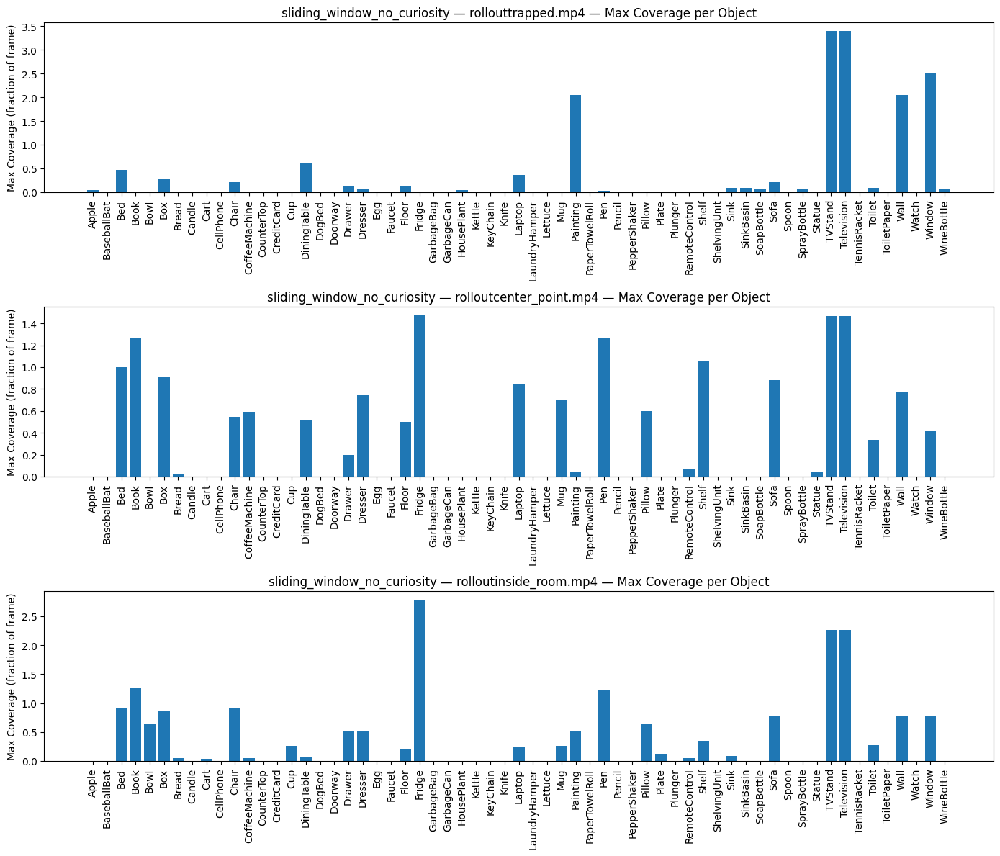

Plotting subfolder: sliding_window_pace


/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/ipykernel_52483/3123640842.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(objs, rotation=90)
/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/ipykernel_52483/3123640842.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(objs, rotation=90)
/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/ipykernel_52483/3123640842.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(objs, rotation=90)


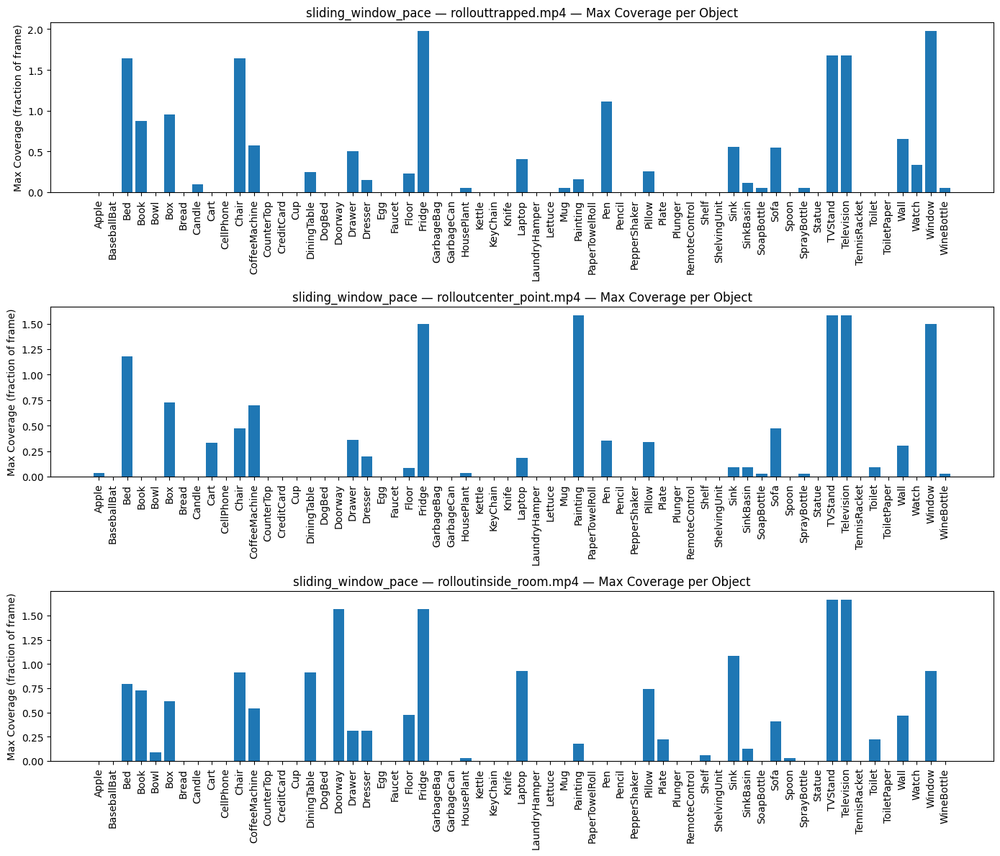

Plotting subfolder: sliding_window_random_resnet


/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/ipykernel_52483/3123640842.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(objs, rotation=90)
/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/ipykernel_52483/3123640842.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(objs, rotation=90)
/var/folders/_7/zhxrcnb92sd44n2lh08mdcn00000gn/T/ipykernel_52483/3123640842.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(objs, rotation=90)


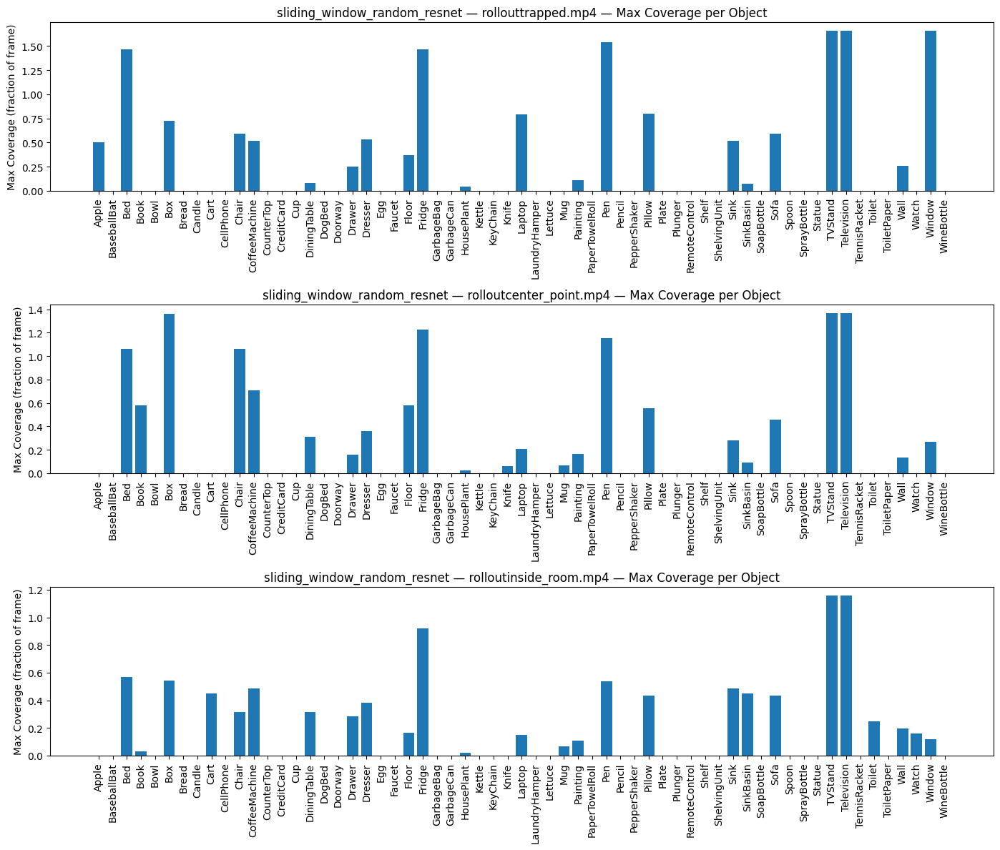

In [ ]:
import json
import matplotlib.pyplot as plt
import numpy as np

with open("object_stats_output.json", "r") as f:
    data = json.load(f)

def plot_max_coverage_per_video_per_subfolder(data):
    """
    Makes one figure per subfolder.
    Inside each: a plot for each video.
    Bars = max coverage for each object.
    """

    for subfolder, videos in data.items():
        print(f"Plotting subfolder: {subfolder}")
        num_videos = len(videos)
        fig, axes = plt.subplots(
            num_videos, 
            1, 
            figsize=(14, 4 * num_videos), 
            squeeze=False
        )

        for idx, (video_name, objects) in enumerate(videos.items()):
            ax = axes[idx][0]

            objs = list(objects.keys())
            max_cov = []
            for obj in objs:
                cov_list = objects[obj]["coverage"]
                max_cov.append(max(cov_list) if cov_list else 0)
            ax.bar(objs, max_cov)
            ax.set_title(f"{subfolder} — {video_name} — Max Coverage per Object")
            ax.set_ylabel("Max Coverage (fraction of frame)")
            ax.set_xticklabels(objs, rotation=90)

        plt.tight_layout()
        plt.show()
plot_max_coverage_per_video_per_subfolder(data)


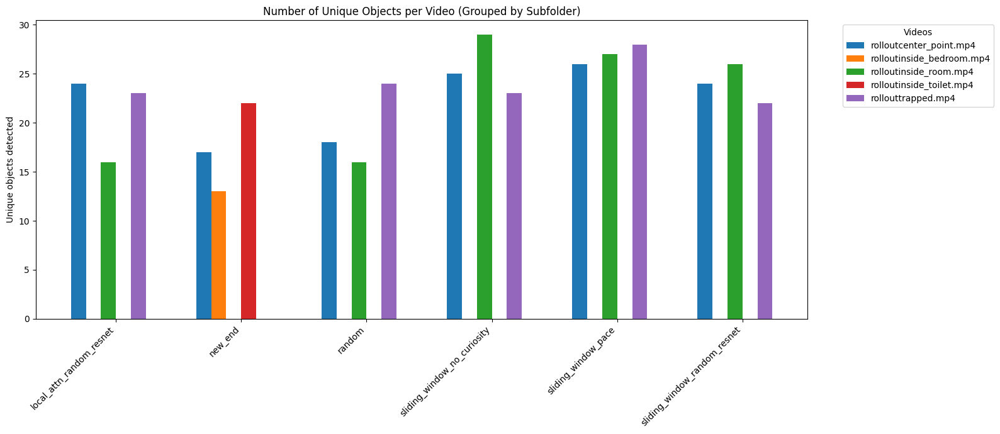

In [ ]:
# create plot to show unique detections for each model + scenario
import json
import matplotlib.pyplot as plt
import numpy as np

with open("object_stats_output.json", "r") as f:
    data = json.load(f)

unique_counts = {}

for subfolder, videos in data.items():
    unique_counts[subfolder] = {}
    for video_name, objects in videos.items():
        # Count how many objects had occurrences > 0
        unique_obj_count = sum(1 for obj, info in objects.items() if info["occurrences"] > 0)
        unique_counts[subfolder][video_name] = unique_obj_count

subfolders = list(unique_counts.keys())
videos = sorted({v for sf in unique_counts.values() for v in sf.keys()})

matrix = []
for sf in subfolders:
    row = []
    for v in videos:
        row.append(unique_counts[sf].get(v, 0))
    matrix.append(row)

matrix = np.array(matrix)

plt.figure(figsize=(16, 7))
x = np.arange(len(subfolders))
bar_width = 0.12

for i, video in enumerate(videos):
    plt.bar(x + i * bar_width, matrix[:, i], width=bar_width, label=video)

plt.xticks(x + bar_width * (len(videos)/2), subfolders, rotation=45, ha='right')
plt.ylabel("Unique objects detected")
plt.title("Number of Unique Objects per Video (Grouped by Subfolder)")
plt.legend(title="Videos", bbox_to_anchor=(1.04, 1), loc="upper left")
plt.tight_layout()
plt.show()

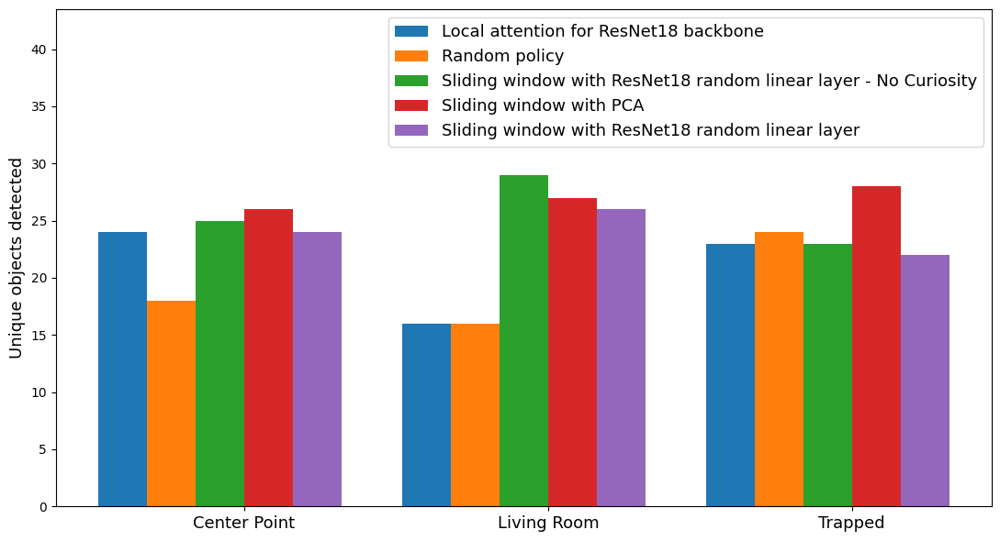

In [30]:
# create the plot to show the detections grouped by scenario
import json
import matplotlib.pyplot as plt
import numpy as np

with open("object_stats_output.json", "r") as f:
    data = json.load(f)

if "new_end" in data:
    del data["new_end"]

subfolders = list(data.keys())

# vids to not plot
videos_to_remove = {
    "rolloutinside_bedroom.mp4",
    "rolloutinside_toilet.mp4"
}

all_videos = sorted({
    video
    for videos in data.values()
    for video in videos.keys()
    if video not in videos_to_remove
})

unique_counts = {sf: {} for sf in subfolders}

for sf in subfolders:
    for video, objects in data[sf].items():
        if video in videos_to_remove:
            continue
        count_unique = sum(1 for obj, info in objects.items() if info["occurrences"] > 0)
        unique_counts[sf][video] = count_unique

matrix = []
for video in all_videos:
    row = [unique_counts[sf].get(video, 0) for sf in subfolders]
    matrix.append(row)

matrix = np.array(matrix)
labels_x = {
    "rollouttrapped.mp4": "Trapped",
    "rolloutcenter_point.mp4": "Center Point",
    "rolloutinside_room.mp4": "Living Room",
}
xtick_labels = [labels_x.get(v, v) for v in all_videos]

legend_labels = {
    "local_attn_random_resnet": "Local attention for ResNet18 backbone",
    "random": "Random policy",
    "sliding_window_pace": "Sliding window with PCA",
    "sliding_window_random_resnet": "Sliding window with ResNet18 random linear layer",
    "sliding_window_no_curiosity": "Sliding window with ResNet18 random linear layer - No Curiosity",
}

plt.figure(figsize=(11, 6))

x = np.arange(len(all_videos))
bar_width = 0.8 / len(subfolders)

for i, sf in enumerate(subfolders):
    plt.bar(
        x + i * bar_width,
        matrix[:, i],
        width=bar_width,
        label=legend_labels.get(sf, sf)
    )

# X-axis ticks
plt.xticks(
    x + bar_width * (len(subfolders) / 2),
    xtick_labels,
    rotation=0,
    fontsize=13
)

# Y-axis label
plt.ylabel("Unique objects detected", fontsize=13)


# Set y-limit
max_height = matrix.max() 
plt.ylim(0, max_height * 1.5)

# Legend
plt.legend(
    ncol=1,
    frameon=True,
    fontsize=13,
)

plt.tight_layout()
plt.show()

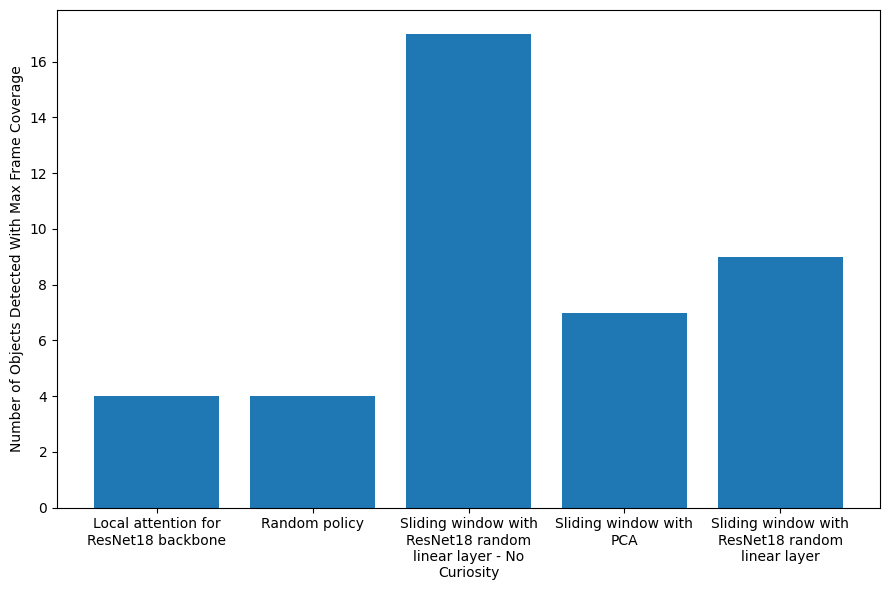

In [49]:
import textwrap
with open("object_stats_output.json", "r") as f:
    data = json.load(f)

if "new_end" in data:
    del data["new_end"]

subfolders = list(data.keys())

videos_to_remove = {
    "rolloutinside_bedroom.mp4",
    "rolloutinside_toilet.mp4"
}
models = list(data.keys())

# --- Collect all objects across all videos and models ---
all_objects = set()
for model in models:
    for video_name, objects in data[model].items():
        if video_name in videos_to_remove:
            continue
        for obj in objects.keys():
            all_objects.add(obj)
all_objects = sorted(all_objects)

# --- Compute max coverage per object per model ---
max_cov = {model: {} for model in models}

for model in models:
    for obj in all_objects:
        max_cov[model][obj] = 0  # initialize

    for video_name, objects in data[model].items():
        if video_name in videos_to_remove:
            continue
        for obj, stats in objects.items():
            if stats["coverage"]:
                max_cov[model][obj] = max(max_cov[model][obj], max(stats["coverage"]))

# --- Count 1 per object for whichever model had max coverage ---
count_detected = {model: 0 for model in models}

for obj in all_objects:
    obj_max = max(max_cov[m][obj] for m in models)
    if obj_max == 0:
        continue  # object never seen
    for model in models:
        if max_cov[model][obj] == obj_max:
            count_detected[model] += 1


legend_labels = {
    "local_attn_random_resnet": "Local attention for ResNet18 backbone",
    "random": "Random policy",
    "sliding_window_pace": "Sliding window with PCA",
    "sliding_window_random_resnet": "Sliding window with ResNet18 random linear layer",
    "sliding_window_no_curiosity": "Sliding window with ResNet18 random linear layer - No Curiosity",
}

plt.figure(figsize=(9, 6))
keys = list(count_detected.keys())
wrapped_labels = [
    "\n".join(textwrap.wrap(legend_labels[k], width=20))
    for k in keys
]

plt.bar(count_detected.keys(), count_detected.values())

plt.ylabel("Number of Objects Detected With Max Frame Coverage")

plt.xticks(ticks=range(len(keys)),labels=wrapped_labels)

plt.tight_layout()
plt.show()

In [1]:
!pip install faiss-cpu sentence-transformers numpy
!pip install --upgrade sentence-transformers

In [ ]:
import faiss
import numpy as np

stored_metadata = []

In [8]:
from sentence_transformers import SentenceTransformer

encoder = SentenceTransformer('all-MiniLM-L6-v2')

captions = [
    "a tv in the living room",
    "a green plant on the table",
    "a brown chair near the window",
    "a dog playing on the floor",
    "a laptop on the desk"
]

metadata = [
    {"video": "video1.mp4", "frame": 10, "object": "tv"},
    {"video": "video1.mp4", "frame": 20, "object": "plant"},
    {"video": "video2.mp4", "frame": 5, "object": "chair"},
    {"video": "video2.mp4", "frame": 15, "object": "dog"},
    {"video": "video3.mp4", "frame": 8, "object": "laptop"}
]

# Encode captions into embeddings
embeddings = encoder.encode(captions, normalize_embeddings=True)
print("Embeddings shape:", embeddings.shape)

Embeddings shape: (5, 384)


In [9]:
embedding_dim = embeddings.shape[1]

index = faiss.IndexFlatL2(embedding_dim)

index.add(np.array(embeddings, dtype=np.float32))

print("FAISS index contains", index.ntotal, "vectors")

FAISS index contains 5 vectors


In [10]:
query = "tv in the room"

# Encode query
query_embedding = encoder.encode([query], normalize_embeddings=True)

# Search top-3 nearest neighbors
D, I = index.search(np.array(query_embedding, dtype=np.float32), k=3)

print("Distances:", D)
print("Indices:", I)

print("Top matches:")
for idx in I[0]:
    print(f"Caption: {captions[idx]}")
    print(f"Metadata: {metadata[idx]}")
    print(f"Distance: {D[0][list(I[0]).index(idx)]:.4f}\n")

Distances: [[0.20512576 1.2671853  1.4460604 ]]
Indices: [[0 4 2]]
Top matches:
Caption: a tv in the living room
Metadata: {'video': 'video1.mp4', 'frame': 10, 'object': 'tv'}
Distance: 0.2051

Caption: a laptop on the desk
Metadata: {'video': 'video3.mp4', 'frame': 8, 'object': 'laptop'}
Distance: 1.2672

Caption: a brown chair near the window
Metadata: {'video': 'video2.mp4', 'frame': 5, 'object': 'chair'}
Distance: 1.4461



### Additional: testing the accuracy of RAM and YOLO model (run after saving the the Boolean array for the respective model you want to check the accuracy for)

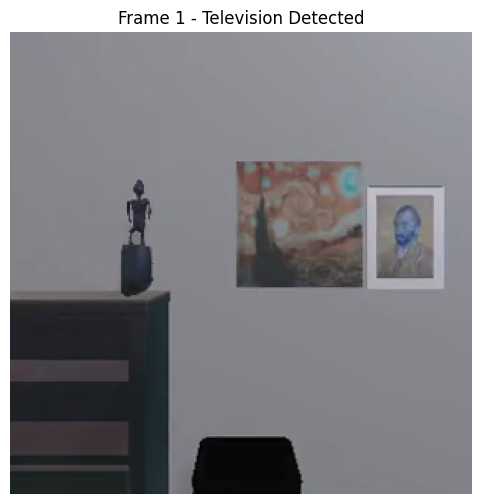

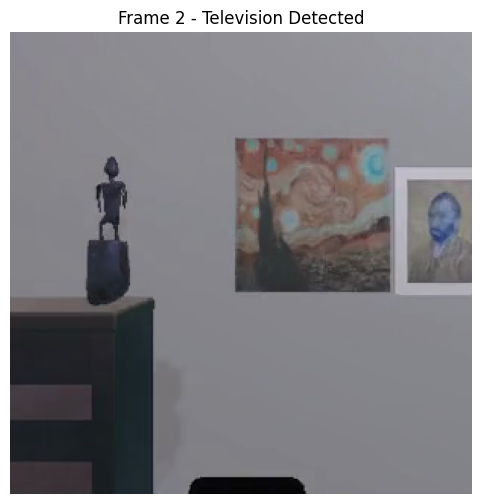

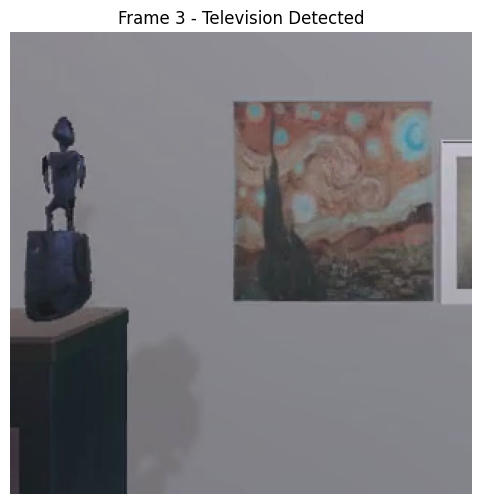

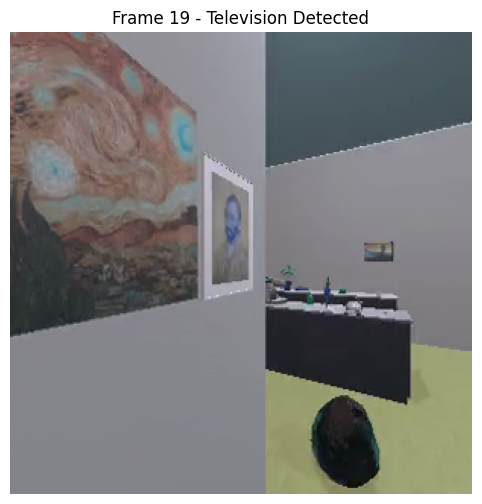

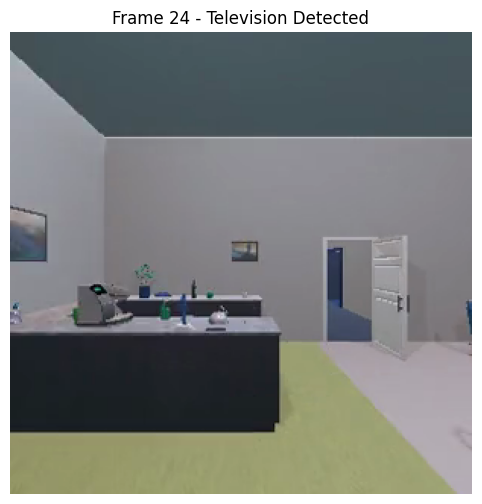

...

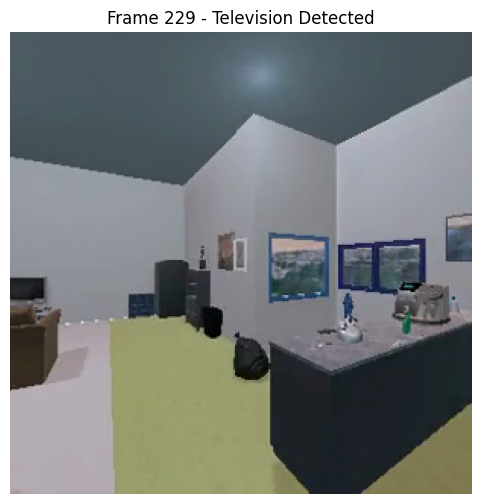

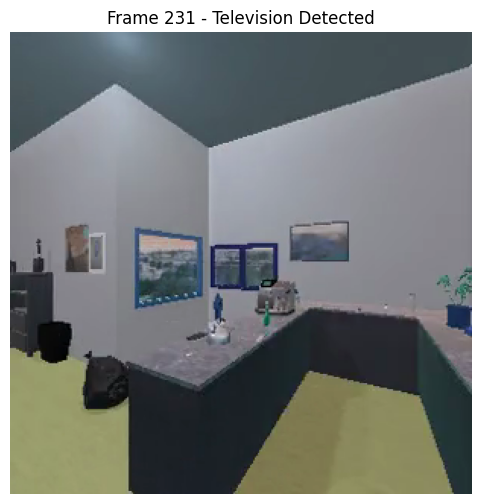

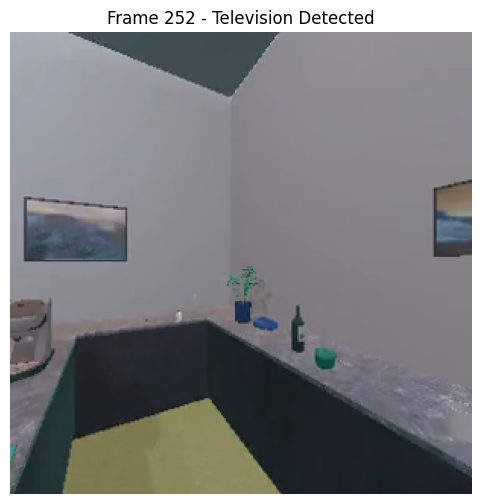

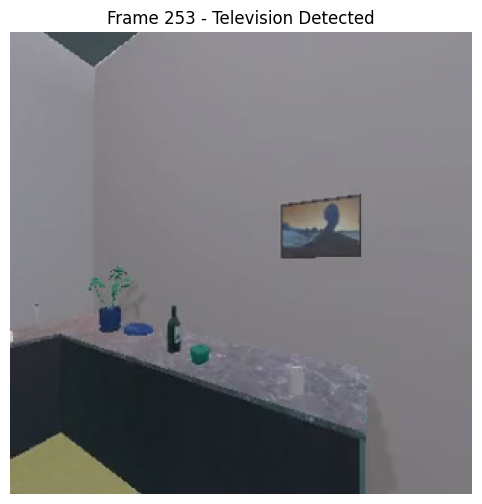

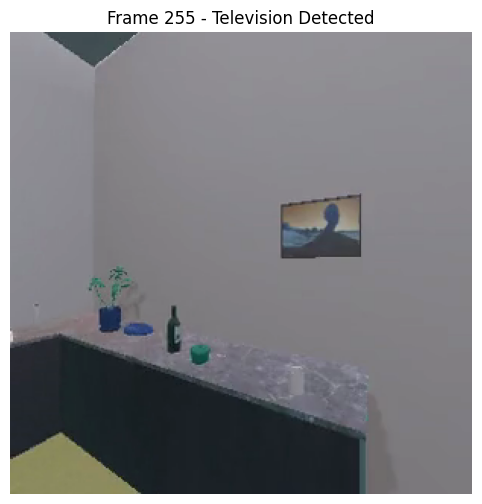

In [ ]:
import cv2
import matplotlib.pyplot as plt

video_path = '../rollout_go_room.mp4'
vid = cv2.VideoCapture(video_path)

frame_idx = 0
mask_idx = 0

while True:
    ok, frame = vid.read()
    if not ok:
        break
    
    if television_mask[mask_idx] == 1:
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(8,6))
        plt.imshow(frame_rgb)
        plt.title(f"Frame {frame_idx} - Television Detected")
        plt.axis('off')
        plt.show(block=True)
    
    frame_idx += 1
    mask_idx += 1

vid.release()

In [20]:
model = YOLO("yolov8n-seg.pt")

frame = Image.open("data/images/frame_104.png")
frame = np.array(frame)

yolo = model(frame)
masks = yolo[0].masks 

tv_masks = []
if masks is not None:
    for mask, cls in zip(masks.data, yolo[0].boxes.cls):
        class_name = model.names[int(cls)]
        if class_name in ("tv", "television"):
            tv_masks.append(mask.cpu().numpy())


0: 640x640 1 person, 1 tv, 122.9ms
Speed: 2.1ms preprocess, 122.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
